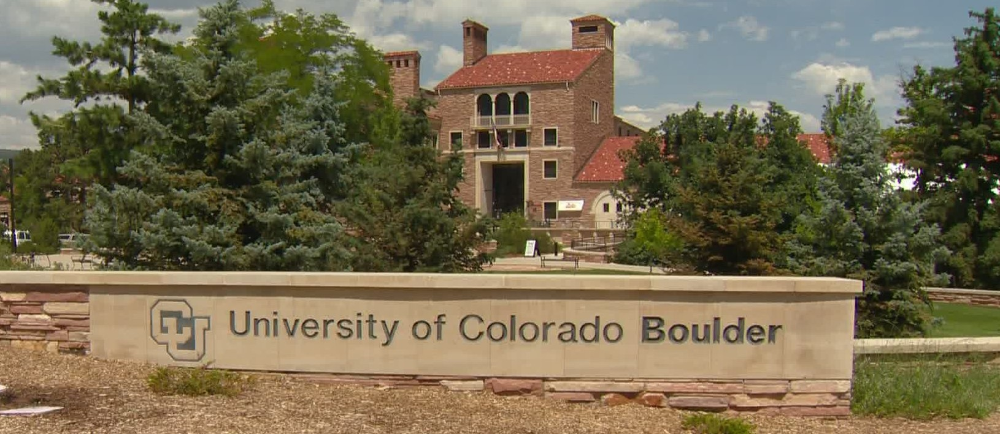

# Topic

This jupyter notebook is a project of the University of Colorado Boulder Master of Science in Data Science course DTSA-5511 - Introduction to Deep Learning.

It is based on the  Kaggle "Generative Dog Images" competition. Details about the competition and dataset could be found here: https://www.kaggle.com/competitions/generative-dog-images/overview

This Kaggle competition is about generating images with dogs. It is an excellent introduction to generative adversarial network (GAN). 

A generative adversarial network (GAN) is a class of machine learning system invented by Ian Goodfellow in 2014. Two neural networks compete with each other in a game. Given a training set, this technique learns to generate new data with the same statistics as the training set.

In this competition, you’ll be training generative models to create images of dogs. Only this time… there’s no ground truth data for you to predict. Here, you’ll submit the images and be scored based on how well those images are classified as dogs from pre-trained neural networks. Take these images, for example. Can you tell which are real vs. generated?

As base for this notebook I used the tensoflow tutorial "Deep Convolutional Generative Adversarial Network" (https://www.tensorflow.org/tutorials/generative/dcgan) as well as the getting started notebook from Kaggle for this competition (GAN dogs starter, https://www.kaggle.com/code/wendykan/gan-dogs-starter/notebook)

## Data
The Stanford Dogs dataset contains images of 120 breeds of dogs from around the world. This dataset has been built using images and annotation from ImageNet for the task of fine-grained image categorization. Details about an dthe data could be found on following website: http://vision.stanford.edu/aditya86/ImageNetDogs/.

The train data could be also found at [Kaggle competition page](https://www.kaggle.com/competitions/generative-dog-images/data)

## Importing libraries

In [1]:
import tensorflow as tf
import glob
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
from tensorflow.keras import layers
import time
from IPython import display
import xml.etree.ElementTree as ET # for parsing XML

from tensorflow.keras.preprocessing.image import ImageDataGenerator


#import pandas as pd
# import numpy as np

# # for performace patch
# from sklearnex import patch_sklearn
# patch_sklearn() # withe larger no of trees kernel dies
 
# # disable  patching
# #from sklearnex import unpatch_sklearn
# #unpatch_sklearn()

# import matplotlib.pyplot as plt
# from mpl_toolkits import mplot3d 
# import seaborn as sns
# from scipy.stats import mode

# import warnings
# warnings.filterwarnings('ignore')

# from time import time # to messure running time

# from sklearn import metrics
# from sklearn.metrics import accuracy_score, confusion_matrix

# from sklearn.model_selection import cross_val_score, GridSearchCV

# from sklearn.model_selection import train_test_split

# from sklearn.ensemble import RandomForestClassifier # Load random forest classifier 

# from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
# from sklearn.decomposition import NMF

# import itertools # For iteration over found categories and assign best match

# import os

# set Kaggle API for download and submission
from kaggle.api.kaggle_api_extended import KaggleApi

## Exploratory Data Analysis (EDA)

## Download data

I downloaded the data locally and saved it into my workdir of the project. 

In [2]:
# User and API key is stored in config
import config

# set user and API key
os.environ['KAGGLE_USERNAME'] = config.KAGGLE_USERNAME
os.environ['KAGGLE_KEY'] = config.KAGGLE_KEY

api = KaggleApi()
api.authenticate()

In [3]:
# Download competition files in data directory
api.competition_download_files("generative-dog-images", path="data")

# unzip files
!unzip -d data "./data/generative-dog-images.zip"
#!rm "./data/nlp-getting-started.zip"

Archive:  ./data/generative-dog-images.zip
  inflating: data/Annotation.zip     
  inflating: data/all-dogs.zip       


In [ ]:
!unzip -d data "./data/Annotation.zip"
!unzip -d data "./data/all-dogs.zip"

## Importing data, cleaning and analysis

### Import data and get first overview


In [3]:
# Create data input from flies with keras image generator flow
#BATCH_SIZE = 1024
BATCH_SIZE = 4096
#BATCH_SIZE = 20580  --> OOM

train_datagen = ImageDataGenerator(
#        featurewise_center=True,
        samplewise_center=True,
        samplewise_std_normalization=True,
#        validation_split=0.2,
        dtype='float32',
        rotation_range=20,
#        horizontal_flip=True,
        vertical_flip=True
        )


train_generator = train_datagen.flow_from_directory(
    directory="./data",
#    target_size = (64, 64), # This is taget size for submission
    target_size = (28, 28),
#    subset='training',
#    color_mode='rgb',
    color_mode='grayscale',
    classes=None,
    #class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    save_to_dir=None,
    interpolation='nearest',
)

Found 41163 images belonging to 3 classes.


## Create the models

Both the generator and discriminator are defined using the [Keras Sequential API](https://www.tensorflow.org/guide/keras#sequential_model).

### The Generator

The generator uses `tf.keras.layers.Conv2DTranspose` (upsampling) layers to produce an image from a seed (random noise). Start with a `Dense` layer that takes this seed as input, then upsample several times until you reach the desired image size of 28x28x1. Notice the `tf.keras.layers.LeakyReLU` activation for each layer, except the output layer which uses tanh.

In [4]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(7*7*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((7, 7, 256)))
    assert model.output_shape == (None, 7, 7, 256)  # Note: None is the batch size

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    assert model.output_shape == (None, 7, 7, 128)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 14, 14, 64)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 28, 28, 1)

    return model

Use the (as yet untrained) generator to create an image.

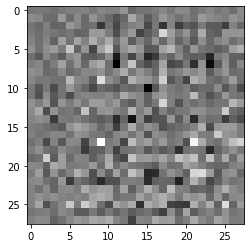

In [5]:
generator = make_generator_model()

noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0], cmap='gray')

In [6]:
generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 12544)             1254400   
                                                                 
 batch_normalization (BatchN  (None, 12544)            50176     
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 12544)             0         
                                                                 
 reshape (Reshape)           (None, 7, 7, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 7, 7, 128)        819200    
 nspose)                                                         
                                                                 
 batch_normalization_1 (Batc  (None, 7, 7, 128)        5

### The Discriminator

The discriminator is a CNN-based image classifier.

In [7]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[28, 28, 1]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model

Use the (as yet untrained) discriminator to classify the generated images as real or fake. The model will be trained to output positive values for real images, and negative values for fake images.

In [8]:
discriminator = make_discriminator_model()
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[0.00034365]], shape=(1, 1), dtype=float32)


In [9]:
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 14, 14, 64)        1664      
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 14, 14, 64)        0         
                                                                 
 dropout (Dropout)           (None, 14, 14, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 7, 7, 128)         204928    
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 7, 7, 128)         0         
                                                                 
 dropout_1 (Dropout)         (None, 7, 7, 128)         0         
                                                                 
 flatten (Flatten)           (None, 6272)             

## Define the loss and optimizers

Define loss functions and optimizers for both models.

In [10]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

### Discriminator loss

This method quantifies how well the discriminator is able to distinguish real images from fakes. It compares the discriminator's predictions on real images to an array of 1s, and the discriminator's predictions on fake (generated) images to an array of 0s.

In [11]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

### Generator loss
The generator's loss quantifies how well it was able to trick the discriminator. Intuitively, if the generator is performing well, the discriminator will classify the fake images as real (or 1). Here, compare the discriminators decisions on the generated images to an array of 1s.

In [12]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

The discriminator and the generator optimizers are different since you will train two networks separately.

In [13]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

### Save checkpoints
This notebook also demonstrates how to save and restore models, which can be helpful in case a long running training task is interrupted.

In [14]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## Define the training loop

In [15]:
EPOCHS = 50
noise_dim = 100
num_examples_to_generate = 16

# You will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)
seed = tf.random.normal([num_examples_to_generate, noise_dim])

The training loop begins with generator receiving a random seed as input. That seed is used to produce an image. The discriminator is then used to classify real images (drawn from the training set) and fakes images (produced by the generator). The loss is calculated for each of these models, and the gradients are used to update the generator and discriminator.

In [16]:
# global dataframe with loss
#loss = pd.DataFrame(columns=['gen_loss', 'disc_loss'])

# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
@tf.function
def train_step(images):
    # change global dataframe with loss
    global loss
    
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
        
#         d = {'gen_loss': [gen_loss], 'disc_loss': [disc_loss]}
#         pd.concat([loss, df2])
#        loss.loc[len(loss.index)-1] = [tf.reduce_sum(gen_loss).eval(), tf.reduce_sum(disc_loss).eval()]
        

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

In [17]:
def train(dataset, epochs, iniepochs=0):
    fulltime = 0
    for epoch in range(epochs):
        start = time.time()
        batches = 0

        for image_batch, y in dataset:
            train_step(image_batch/255)

            batches += 1
#            print("next step, ", image_batch.shape)
            
            if batches >= 20579 / BATCH_SIZE:
                # we need to break the loop by hand because
                # the generator loops indefinitely
                break


        # Produce images for the GIF as you go
        display.clear_output(wait=True)
        generate_and_save_images(generator,
                                 epoch+iniepochs + 1,
                                 seed)

        # Save the model every 15 epochs
        if (epoch + 1) % 15 == 0:
              checkpoint.save(file_prefix = checkpoint_prefix)
        
        print ('Time for epoch {} is {} sec'.format(epoch+iniepochs + 1, time.time()-start))
        fulltime += time.time()-start
        print ('Time so far is {} sec'.format(fulltime))
#        print ('Generator loss: ', loss.loc[len(loss.index)-1].gen_loss, 'Discriminator loss: ',loss.loc[len(loss.index)-1].disc_loss)

    # Generate after the final epoch
#     display.clear_output(wait=True)
#     generate_and_save_images(generator,
#                                epochs,
#                               seed)

**Generate and save images**

In [18]:
def generate_and_save_images(model, epoch, test_input):
    # Notice `training` is set to False.
    # This is so all layers run in inference mode (batchnorm).
    predictions = model(test_input, training=False)

    fig = plt.figure(figsize=(10, 10))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        #plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
        plt.imshow(predictions[i, :, :, 0] * 255, cmap='gray')
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

## Train the model
Call the `train()` method defined above to train the generator and discriminator simultaneously. Note, training GANs can be tricky. It's important that the generator and discriminator do not overpower each other (e.g., that they train at a similar rate).

At the beginning of the training, the generated images look like random noise. As training progresses, the generated digits will look increasingly real. After about 50 epochs, they resemble MNIST digits. This may take about one minute / epoch with the default settings on Colab.

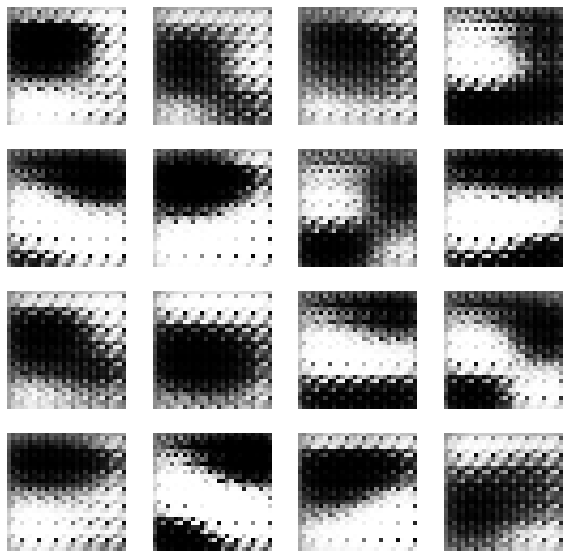

In [23]:
train(train_generator, epochs=EPOCHS, iniepochs=0)

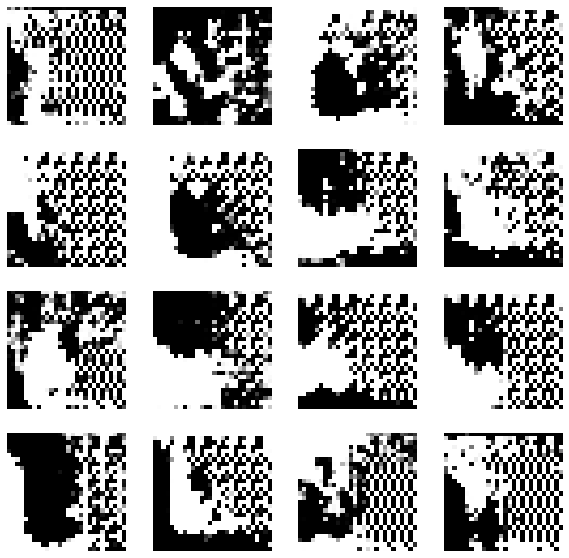

Time for epoch 2000 is 41.10851740837097 sec
Time so far is 20597.801152706146 sec


In [54]:
# continue training
train(train_generator, epochs=500, iniepochs=1500)

Restore the latest checkpoint.

In [64]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

## Create a GIF

In [86]:
# Display a single image using the epoch number
def display_image(epoch_no):
    return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))

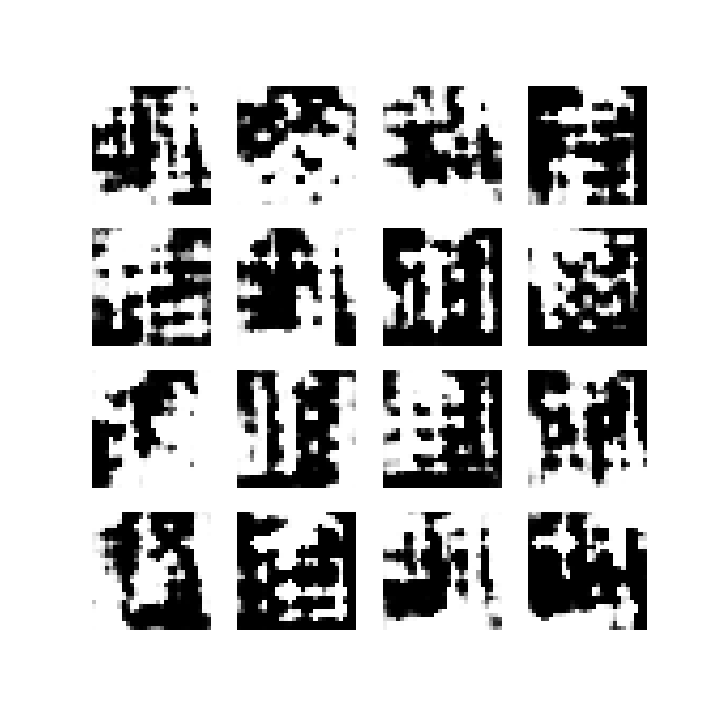

In [48]:
display_image(500)

# Change Network to final size of 64x64 and colour images

In [19]:
# Create data input from flies with keras image generator flow
BATCH_SIZE = 128
#BATCH_SIZE = 256 --> OOM
#BATCH_SIZE = 512 --> OOM
#BATCH_SIZE = 1024 --> OOM
#BATCH_SIZE = 4096 --> OOM
#BATCH_SIZE = 20580  --> OOM

train_datagen = ImageDataGenerator(
#        featurewise_center=True,
#        samplewise_center=True,
#        samplewise_std_normalization=True,
#        validation_split=0.2,
        dtype='float32',
        rotation_range=20,
        horizontal_flip=True,
#        vertical_flip=True
        )


train_generator = train_datagen.flow_from_directory(
    directory="./data",
    target_size = (64, 64), # This is taget size for submission
#    target_size = (28, 28),
#    subset='training',
    color_mode='rgb',
#    color_mode='grayscale',
    classes=None,
    #class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
#    seed=42,
    save_to_dir=None,
    interpolation='nearest',
)

Found 41163 images belonging to 3 classes.


In [20]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(8*8*1024, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((8, 8, 1024)))

    model.add(layers.Conv2DTranspose(256, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(layers.GaussianNoise(0.1))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.GaussianNoise(0.1))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    
    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.GaussianNoise(0.1))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    #model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='sigmoid')) 

    return model

TensorShape([1, 64, 64, 3])

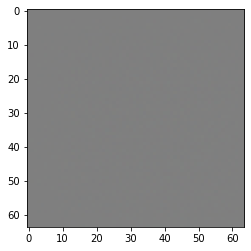

In [21]:
generator = make_generator_model()

noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False) * 0.5 + 0.5 # because of -1/1 from tanh

#plt.imshow(generated_image[0, :, :, 0], cmap='gray')
#plt.imshow(generated_image[0, :, :, 0])
plt.imshow(generated_image[0, :, :, :])
generated_image.shape
#generated_image[0, :, :, :] * 127,5

In [22]:
generator.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 65536)             6553600   
                                                                 
 batch_normalization_3 (Batc  (None, 65536)            262144    
 hNormalization)                                                 
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 65536)             0         
                                                                 
 reshape_1 (Reshape)         (None, 8, 8, 1024)        0         
                                                                 
 conv2d_transpose_3 (Conv2DT  (None, 8, 8, 256)        6553600   
 ranspose)                                                       
                                                                 
 gaussian_noise (GaussianNoi  (None, 8, 8, 256)       

In [23]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[64, 64, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(512, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(1024, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))
  
    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model

In [24]:
discriminator = make_discriminator_model()
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[0.00566749]], shape=(1, 1), dtype=float32)


In [25]:
discriminator.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 32, 32, 256)       19456     
                                                                 
 leaky_re_lu_9 (LeakyReLU)   (None, 32, 32, 256)       0         
                                                                 
 dropout_2 (Dropout)         (None, 32, 32, 256)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 16, 16, 512)       3277312   
                                                                 
 leaky_re_lu_10 (LeakyReLU)  (None, 16, 16, 512)       0         
                                                                 
 dropout_3 (Dropout)         (None, 16, 16, 512)       0         
                                                                 
 conv2d_4 (Conv2D)           (None, 8, 8, 1024)       

In [26]:
# global dataframe with loss
#loss = pd.DataFrame(columns=['gen_loss', 'disc_loss'])

# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
@tf.function
def train_step(images):
    # change global dataframe with loss
    global loss
    
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True) * 0.5 + 0.5 # because of -1/1 from tanh

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
        
#         d = {'gen_loss': [gen_loss], 'disc_loss': [disc_loss]}
#         pd.concat([loss, df2])
#        loss.loc[len(loss.index)-1] = [tf.reduce_sum(gen_loss).eval(), tf.reduce_sum(disc_loss).eval()]
        

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

In [27]:
def generate_and_save_images(model, epoch, test_input):
    # Notice `training` is set to False.
    # This is so all layers run in inference mode (batchnorm).
    predictions = model(test_input, training=False)* 0.5 + 0.5 # because of -1/1 from tanh

    fig = plt.figure(figsize=(10, 10))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        #plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5)
        plt.imshow(predictions[i, :, :, :])
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

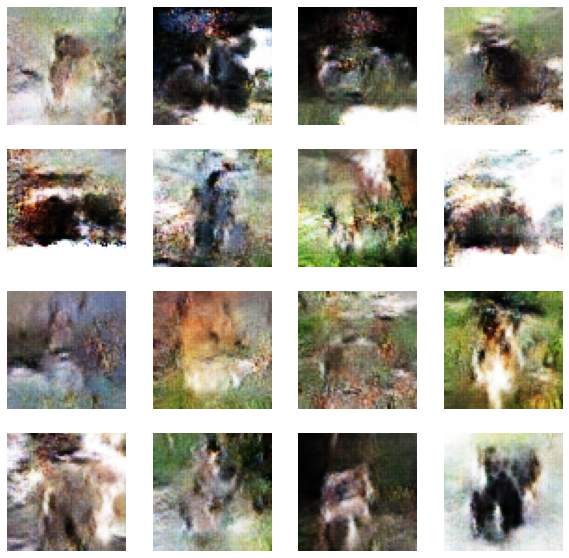

Time for epoch 500 is 248.58120393753052 sec
Time so far is 133405.20109510422 sec


In [71]:
train(train_generator, epochs=500, iniepochs=0)

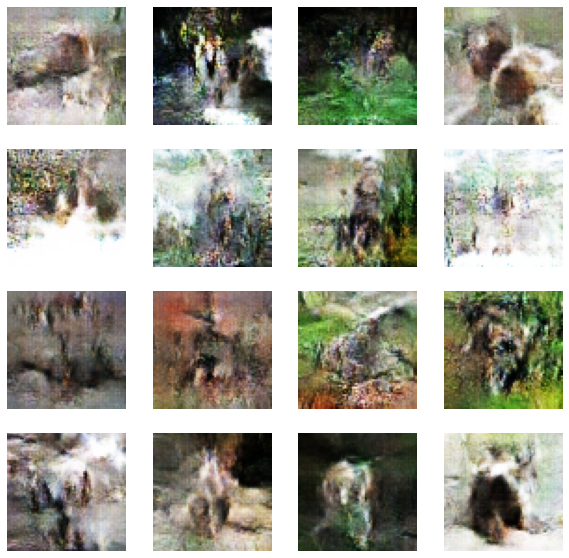

Time for epoch 650 is 283.7444591522217 sec
Time so far is 41246.268580913544 sec


In [116]:
# continue training
history = train(train_generator, epochs=150, iniepochs=500)

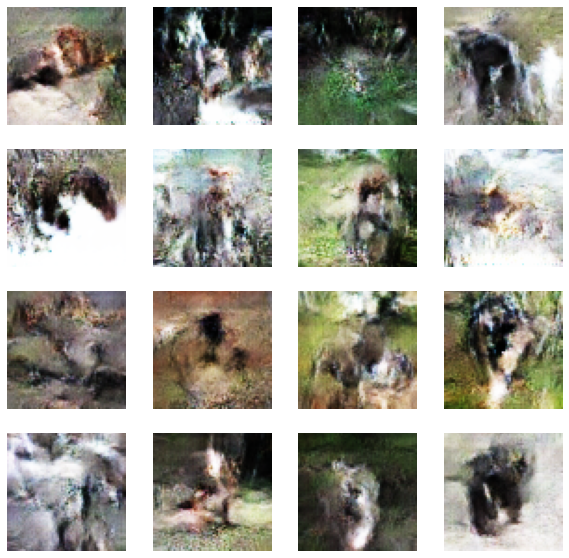

Time for epoch 750 is 252.85971999168396 sec
Time so far is 12733.311705112457 sec


In [125]:
# continue training
train(train_generator, epochs=50, iniepochs=700)

## Try Performance when images are croped to annotations

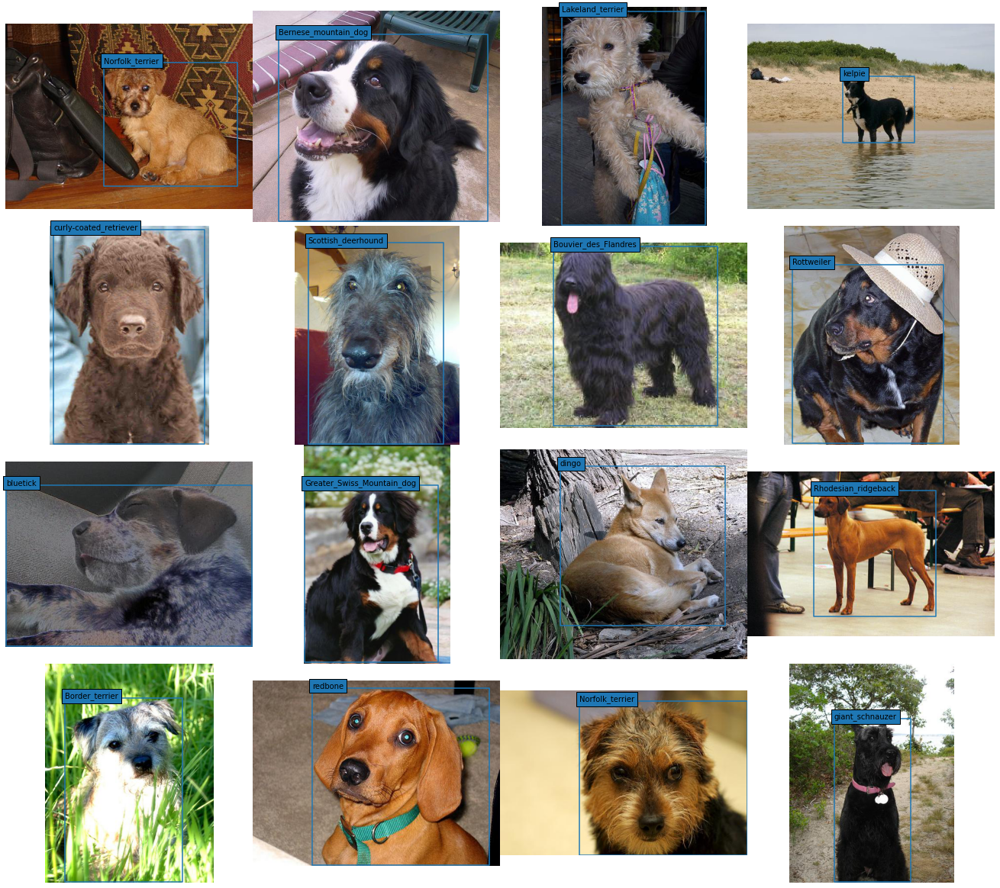

In [37]:
# Import annotations
# This Part is from Kaggle notebook "Show Annotations and Breeds" from competition
# https://www.kaggle.com/code/paulorzp/show-annotations-and-breeds/notebook

breeds = os.listdir('./data/annotation/Annotation/') # list of all breeds

# show some random annotations with bounding box

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(18,16))
for indx, axis in enumerate(axes.flatten()):
    breed = np.random.choice(breeds)
    dog = np.random.choice(os.listdir('./data/annotation/Annotation/' + breed))
    img = PIL.Image.open('./data/all-dogs/' + dog + '.jpg') 
    tree = ET.parse('./data/annotation/Annotation/' + breed + '/' + dog)
    root = tree.getroot()
    objects = root.findall('object')
    axis.set_axis_off() 
    imgplot = axis.imshow(img)
    for o in objects:
        bndbox = o.find('bndbox') # reading bound box
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)
        axis.plot([xmin, xmax, xmax, xmin, xmin], [ymin, ymin, ymax, ymax, ymin]) # show box
        axis.text(xmin, ymin, o.find('name').text, bbox={'ec': None}) # show breed

plt.tight_layout(pad=0, w_pad=0, h_pad=0)

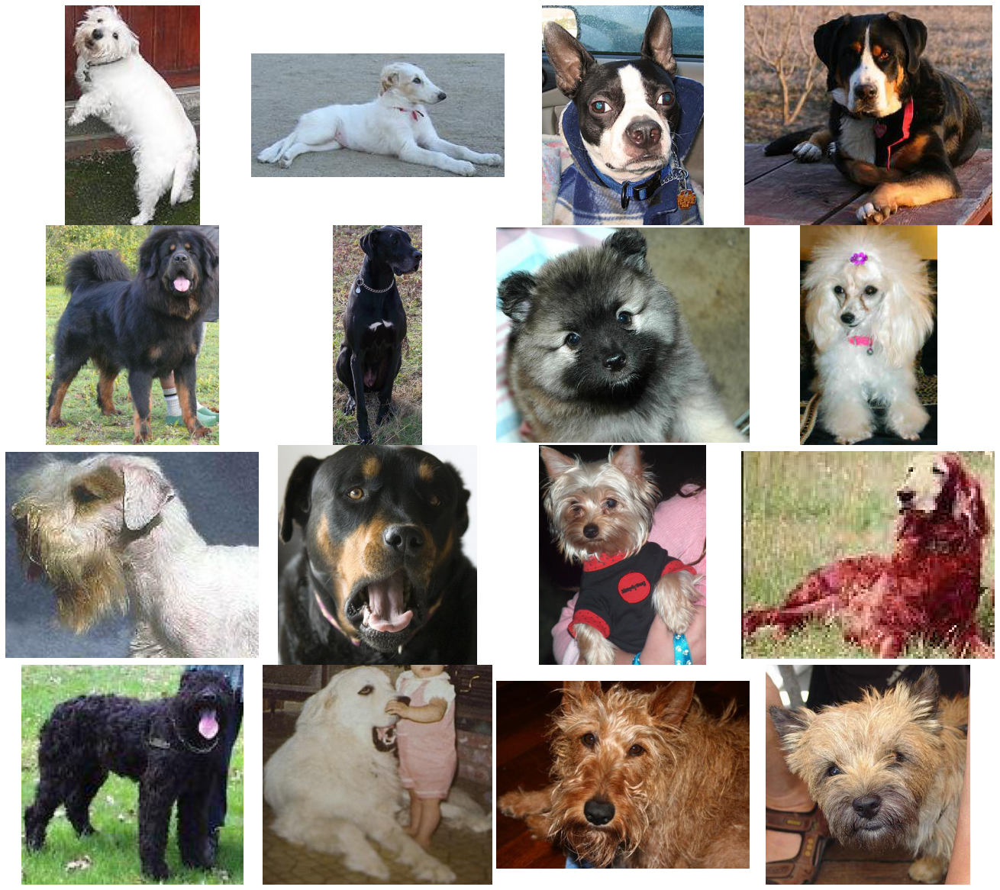

In [38]:
# now try to crop random images to annotations

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(18,16))
for indx, axis in enumerate(axes.flatten()):
    breed = np.random.choice(breeds)
    dog = np.random.choice(os.listdir('./data/annotation/Annotation/' + breed))
    img = PIL.Image.open('./data/all-dogs/' + dog + '.jpg') 
    tree = ET.parse('./data/annotation/Annotation/' + breed + '/' + dog)
    root = tree.getroot()
    objects = root.findall('object')
    
    for o in objects:
        bndbox = o.find('bndbox') # reading bound box
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)
#         axis.plot([xmin, xmax, xmax, xmin, xmin], [ymin, ymin, ymax, ymax, ymin]) # show box
#         axis.text(xmin, ymin, o.find('name').text, bbox={'ec': None}) # show breed    
    
    img = img.crop((xmin, ymin, xmax, ymax))
    
    axis.set_axis_off() 
    imgplot = axis.imshow(img)


plt.tight_layout(pad=0, w_pad=0, h_pad=0)

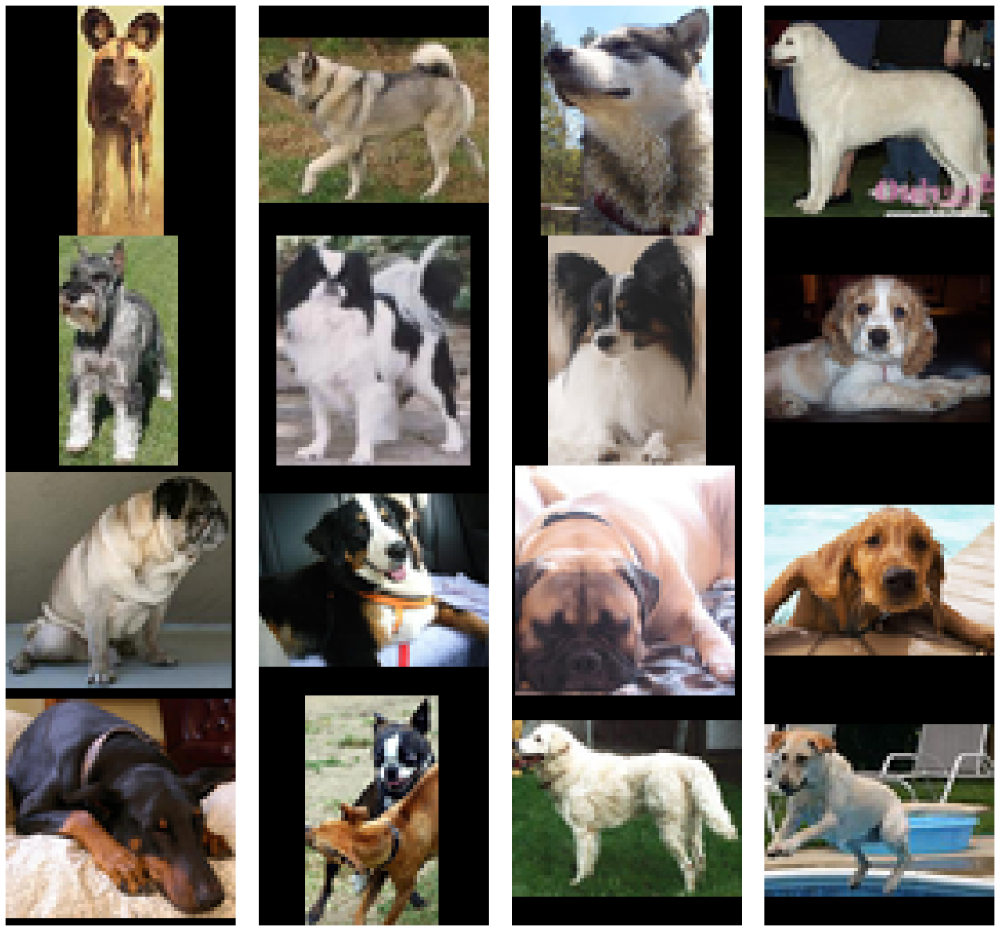

In [39]:
# now try to crop and resize random images to target size and keep aspect ration
# This usefull because tensoflow flow from directory could not pad immage or keep aspect ratio
# so all immages have same sice and bounding box is padded with black

# create new black image in taget size
#black = PIL.Image.new("RGB", (640, 640))


fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(18,16))
for indx, axis in enumerate(axes.flatten()):
    breed = np.random.choice(breeds)
    dog = np.random.choice(os.listdir('./data/annotation/Annotation/' + breed))
    img = PIL.Image.open('./data/all-dogs/' + dog + '.jpg') 
    tree = ET.parse('./data/annotation/Annotation/' + breed + '/' + dog)
    root = tree.getroot()
    objects = root.findall('object')
    
    for o in objects:
        bndbox = o.find('bndbox') # reading bound box
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)
#         axis.plot([xmin, xmax, xmax, xmin, xmin], [ymin, ymin, ymabx, ymax, ymin]) # show box
#         axis.text(xmin, ymin, o.find('name').text, bbox={'ec': None}) # show breed    
    
    # ratio
#   (int(img.size[0] * (64.0 / max(img.size))), int(img.size[1] * (64.0 / max(img.size))))
    
    img = img.crop((xmin, ymin, xmax, ymax))
    #img = img.resize((64,64), PIL.Image.ANTIALIAS)
    img = img.resize((int(img.size[0] * (64.0 / max(img.size))), int(img.size[1] * (64.0 / max(img.size)))), PIL.Image.ANTIALIAS)
    black = PIL.Image.new(mode="RGB", size=(64, 64))
    
    # center immage
    #((64 - img.size[0])/2 ,(64 - img.size[1])/2 )
    black.paste(img, (int((64 - img.size[0])/2) ,int((64 - img.size[1])/2) ))
    
    axis.set_axis_off() 
    imgplot = axis.imshow(black)


plt.tight_layout(pad=0, w_pad=0, h_pad=0)

#black.paste(img)
#plt.imshow(img)

In [215]:
# now crop, resize and pad all images

for breed in breeds:
    for dog in os.listdir('./data/annotation/Annotation/' + breed):
        tree = ET.parse('./data/annotation/Annotation/' + breed + '/' + dog)
        root = tree.getroot()
        objects = root.findall('object')
        
        # check if file exist
        if os.path.isfile('./data/all-dogs/' + dog + '.jpg'):
            
            img = PIL.Image.open('./data/all-dogs/' + dog + '.jpg') 
            
            # only one dog per annotation so no additional index needed
            for o in objects:
                bndbox = o.find('bndbox') # reading bound box
                xmin = int(bndbox.find('xmin').text)
                ymin = int(bndbox.find('ymin').text)
                xmax = int(bndbox.find('xmax').text)
                ymax = int(bndbox.find('ymax').text)
            img = img.crop((xmin, ymin, xmax, ymax))
            img = img.resize((int(img.size[0] * (64.0 / max(img.size))), int(img.size[1] * (64.0 / max(img.size)))), PIL.Image.ANTIALIAS)
            black = PIL.Image.new(mode="RGB", size=(64, 64))
    
            # center immage
            #((64 - img.size[0])/2 ,(64 - img.size[1])/2 )
            black.paste(img, (int((64 - img.size[0])/2) ,int((64 - img.size[1])/2) ))

            black.save("./data/croped/croped/" + breed + "_" + dog + ".jpg")

In [28]:
# Create data input from files with keras image generator flow
BATCH_SIZE = 128

train_datagen = ImageDataGenerator(
        dtype='float32',
#        rotation_range=20,  switched off to keep aspect ration
        horizontal_flip=True,
        )


train_generator = train_datagen.flow_from_directory(
    directory="./data/croped",
    target_size = (64, 64), # This is taget size for submission
    color_mode='rgb',
    classes=None,
    batch_size=BATCH_SIZE,
    shuffle=True,
    save_to_dir=None,
    interpolation='nearest',
)

Found 20579 images belonging to 1 classes.


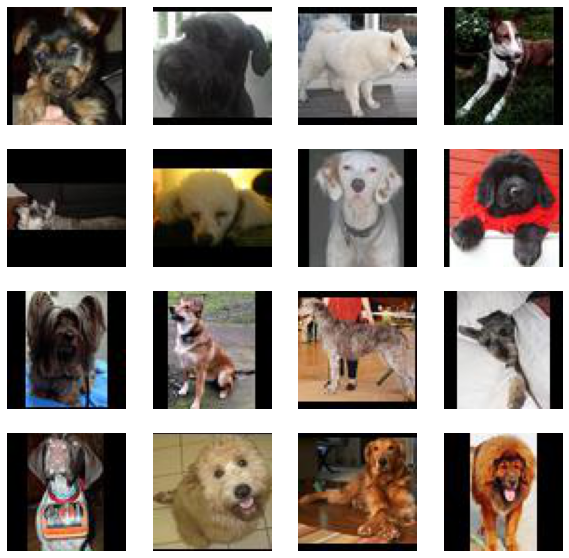

In [29]:
# show some croped images from generator
#plt.imshow(train_generator[0][0][2]/255)

fig = plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4, 4, i+1)
    #plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5)
    plt.imshow(train_generator[0][0][i]/255)
    plt.axis('off')

In [30]:
# add some more noise
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(8*8*1024, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((8, 8, 1024)))

    model.add(layers.Conv2DTranspose(256, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(layers.GaussianNoise(0.2))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.GaussianNoise(0.2))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    
    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.GaussianNoise(0.2))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    #model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='sigmoid')) 

    return model

TensorShape([1, 64, 64, 3])

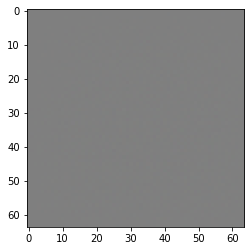

In [31]:
generator = make_generator_model()

noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False) * 0.5 + 0.5 # because of -1/1 from tanh

#plt.imshow(generated_image[0, :, :, 0], cmap='gray')
#plt.imshow(generated_image[0, :, :, 0])
plt.imshow(generated_image[0, :, :, :])
generated_image.shape
#generated_image[0, :, :, :] * 127,5

In [32]:
generator.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 65536)             6553600   
                                                                 
 batch_normalization_7 (Batc  (None, 65536)            262144    
 hNormalization)                                                 
                                                                 
 leaky_re_lu_12 (LeakyReLU)  (None, 65536)             0         
                                                                 
 reshape_2 (Reshape)         (None, 8, 8, 1024)        0         
                                                                 
 conv2d_transpose_7 (Conv2DT  (None, 8, 8, 256)        6553600   
 ranspose)                                                       
                                                                 
 gaussian_noise_3 (GaussianN  (None, 8, 8, 256)       

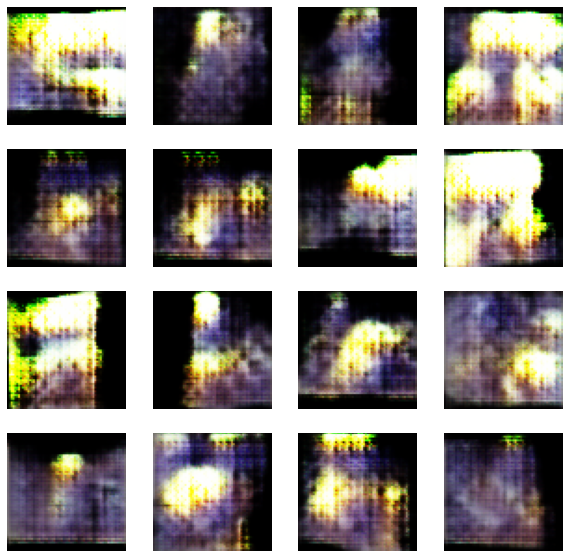

Time for epoch 50 is 247.27329277992249 sec
Time so far is 13258.415976285934 sec


In [33]:
train(train_generator, epochs=50, iniepochs=0)

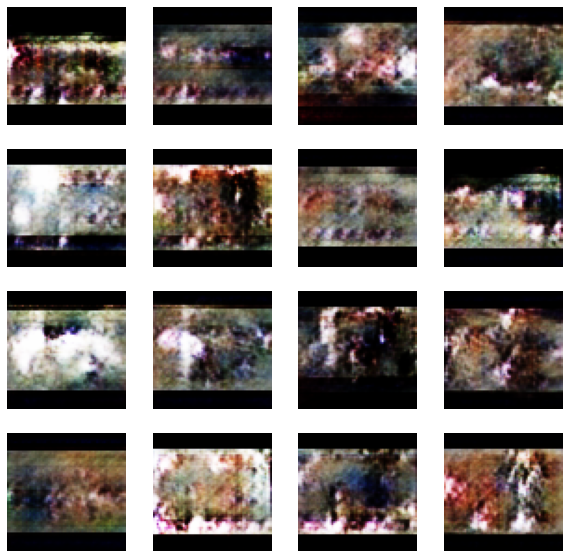

Time for epoch 200 is 254.8795783519745 sec
Time so far is 39550.47582030296 sec


In [34]:
train(train_generator, epochs=150, iniepochs=50)

It looks like it is too much noise and that the black padding is confusion to network. So lets change the padding to the average color and reduce noise in generator

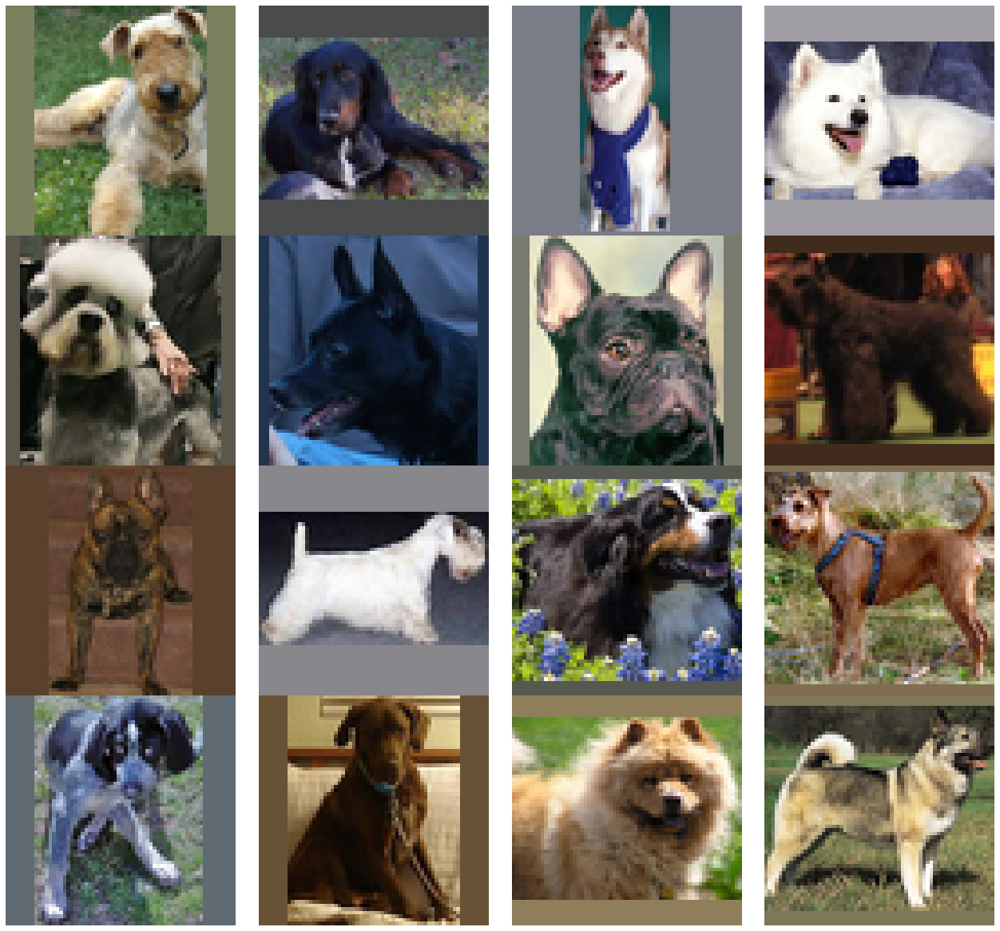

In [71]:
# now try to crop and resize random images to target size and keep aspect ration
# This usefull because tensoflow flow from directory could not pad immage or keep aspect ratio
# so all immages have same sice and bounding box is padded with black

# create new black image in taget size
#black = PIL.Image.new("RGB", (640, 640))


fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(18,16))
for indx, axis in enumerate(axes.flatten()):
    breed = np.random.choice(breeds)
    dog = np.random.choice(os.listdir('./data/annotation/Annotation/' + breed))
    img = PIL.Image.open('./data/all-dogs/' + dog + '.jpg') 
    tree = ET.parse('./data/annotation/Annotation/' + breed + '/' + dog)
    root = tree.getroot()
    objects = root.findall('object')
    
    for o in objects:
        bndbox = o.find('bndbox') # reading bound box
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)
#         axis.plot([xmin, xmax, xmax, xmin, xmin], [ymin, ymin, ymabx, ymax, ymin]) # show box
#         axis.text(xmin, ymin, o.find('name').text, bbox={'ec': None}) # show breed    
    
    # ratio
#   (int(img.size[0] * (64.0 / max(img.size))), int(img.size[1] * (64.0 / max(img.size))))
    
    img = img.crop((xmin, ymin, xmax, ymax))
    #img = img.resize((64,64), PIL.Image.ANTIALIAS)
    img = img.resize((int(img.size[0] * (64.0 / max(img.size))), int(img.size[1] * (64.0 / max(img.size)))), PIL.Image.ANTIALIAS)
    
    # create blank image with average color
    blank = PIL.Image.new(mode="RGB", size=(64, 64), 
                          color=(int(np.mean(np.array(img)[:,:,0])),
                                 int(np.mean(np.array(img)[:,:,1])),
                                 int(np.mean(np.array(img)[:,:,2]))))
    
    # center immage
    #((64 - img.size[0])/2 ,(64 - img.size[1])/2 )
    blank.paste(img, (int((64 - img.size[0])/2) ,int((64 - img.size[1])/2) ))
    
    axis.set_axis_off() 
    imgplot = axis.imshow(blank)


plt.tight_layout(pad=0, w_pad=0, h_pad=0)

#black.paste(img)
#plt.imshow(img)

In [72]:
# now crop, resize and pad all images

for breed in breeds:
    for dog in os.listdir('./data/annotation/Annotation/' + breed):
        tree = ET.parse('./data/annotation/Annotation/' + breed + '/' + dog)
        root = tree.getroot()
        objects = root.findall('object')
        
        # check if file exist
        if os.path.isfile('./data/all-dogs/' + dog + '.jpg'):
            
            img = PIL.Image.open('./data/all-dogs/' + dog + '.jpg') 
            
            # only one dog per annotation so no additional index needed
            for o in objects:
                bndbox = o.find('bndbox') # reading bound box
                xmin = int(bndbox.find('xmin').text)
                ymin = int(bndbox.find('ymin').text)
                xmax = int(bndbox.find('xmax').text)
                ymax = int(bndbox.find('ymax').text)
            img = img.crop((xmin, ymin, xmax, ymax))
            img = img.resize((int(img.size[0] * (64.0 / max(img.size))), int(img.size[1] * (64.0 / max(img.size)))), PIL.Image.ANTIALIAS)
            blank = PIL.Image.new(mode="RGB", size=(64, 64), 
                                  color=(int(np.mean(np.array(img)[:,:,0])),
                                         int(np.mean(np.array(img)[:,:,1])),
                                         int(np.mean(np.array(img)[:,:,2]))))

            # center immage
            #((64 - img.size[0])/2 ,(64 - img.size[1])/2 )
            blank.paste(img, (int((64 - img.size[0])/2) ,int((64 - img.size[1])/2) ))

            blank.save("./data/croped/croped/" + breed + "_" + dog + ".jpg")

In [28]:
# Create data input from files with keras image generator flow
BATCH_SIZE = 128

train_datagen = ImageDataGenerator(
        dtype='float32',
#        rotation_range=20,  switched off to keep aspect ration
        horizontal_flip=True,
        )


train_generator = train_datagen.flow_from_directory(
    directory="./data/croped",
    target_size = (64, 64), # This is taget size for submission
    color_mode='rgb',
    classes=None,
    batch_size=BATCH_SIZE,
    shuffle=True,
    save_to_dir=None,
    interpolation='nearest',
)

Found 20579 images belonging to 1 classes.


In [29]:
# reduce noise to 0.1
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(8*8*1024, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((8, 8, 1024)))

    model.add(layers.Conv2DTranspose(256, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(layers.GaussianNoise(0.1))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.GaussianNoise(0.1))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    
    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.GaussianNoise(0.1))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    #model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='sigmoid')) 

    return model

TensorShape([1, 64, 64, 3])

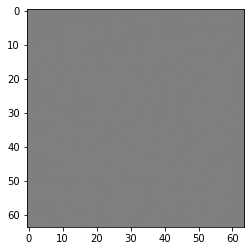

In [30]:
generator = make_generator_model()

noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False) * 0.5 + 0.5 # because of -1/1 from tanh

#plt.imshow(generated_image[0, :, :, 0], cmap='gray')
#plt.imshow(generated_image[0, :, :, 0])
plt.imshow(generated_image[0, :, :, :])
generated_image.shape
#generated_image[0, :, :, :] * 127,5

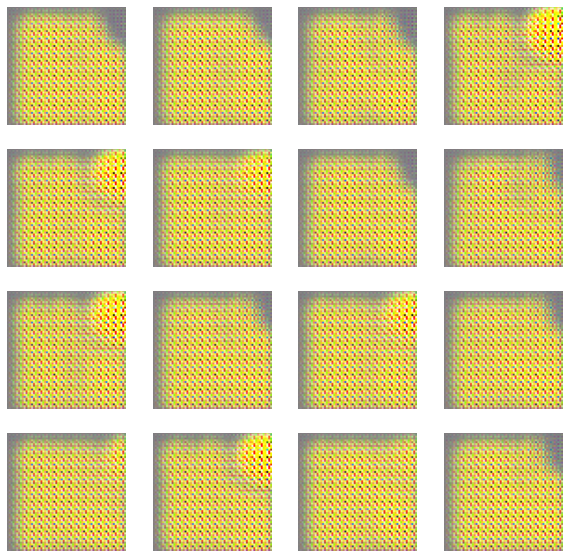

Time for epoch 3 is 351.848268032074 sec
Time so far is 1119.397370815277 sec


In [ ]:
train(train_generator, epochs=50, iniepochs=0)

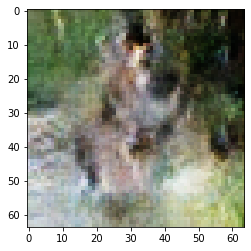

In [77]:
# show single image
generated_image = generator(seed, training=False) * 0.5 + 0.5 # because of -1/1 from tanh

plt.imshow(generated_image[13, :, :, :])
#generated_image[0, :, :, :]

TensorShape([1, 64, 64, 3])

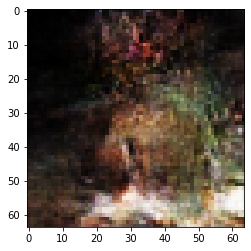

In [113]:
# generate new random immage from noise

noise1 = tf.random.normal([1, 100])
generated_image = generator(noise1, training=False)* 0.5 + 0.5 # because of -1/1 from tanh

plt.imshow(generated_image[0, :, :, :])
generated_image.shape

In [105]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

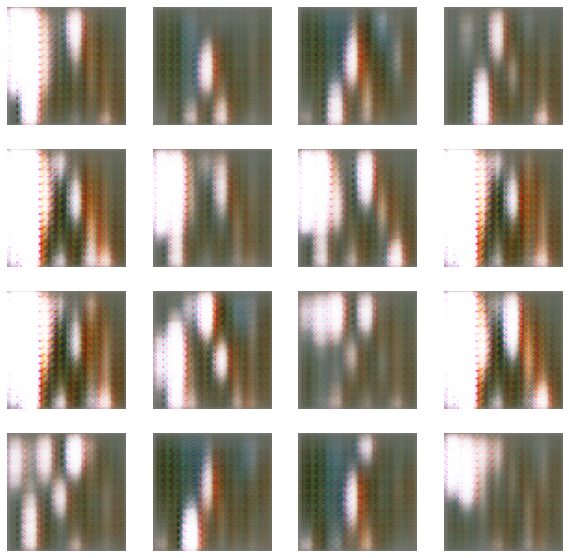

In [122]:
noise_dim = 100
num_examples_to_generate = 25

# You will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)
seed = tf.random.normal([num_examples_to_generate, noise_dim])

generated_image = generator(seed, training=False)
fig = plt.figure(figsize=(10, 10))

for i in range(generated_image.shape[0]):
        plt.subplot(5, 5, i+1)
        #plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5)
        plt.imshow(generated_image[i, :, :, :])
        plt.axis('off')


In [68]:
np.min(train_generator[0][0][2]/255)

0.036624987

In [123]:
history

## Conclusion
....